# London Cafes

**Note**: 
1. `!pip install scikit-learn`, `pip install plotly`, `pip install geopy`, `pip install folium` and `pip install plotnine` need to be installed before loading the packages. 
2. The `HTML` version of the `Jupyter Notebook` should be opened on a browser for better visualisations since the maps and the interactive plots are not visible on `Github` version of `Jupyter Notebook`.

In [1]:
!pip install scikit-learn

In [2]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install geopy

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install plotnine

Note: you may need to restart the kernel to use updated packages.


In [6]:
import copy
import csv
import folium
import json
import math
import matplotlib.pyplot as plt
import nltk
import numpy as np
import pandas as pd
import pgeocode
from math import pi
import pickle
import plotly.express as px
import plotly.graph_objects as go
import plotly.graph_objs as go
import plotly.io as pio
import plotly.offline as pyo
import random
import re
import requests as r
import seaborn as sns
import sklearn.metrics as metric
import spacy
import string
import time
import warnings
import matplotlib.gridspec as gridspec
from bs4 import BeautifulSoup as soup
from collections import Counter
from datetime import datetime
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster
from IPython.display import display, Markdown
from math import radians
from matplotlib import rcParams
#nltk.download('omw-1.4')
#nltk.download('stopwords')
#nltk.download('wordnet')
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer
from plotnine import *
from plotnine import ggplot, aes, geom_point, scale_color_gradient, labs
from sklearn.cluster import KMeans
from sklearn.datasets import make_classification
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.metrics.pairwise import haversine_distances
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from textblob import TextBlob
from wordcloud import WordCloud
warnings.filterwarnings('ignore')
%matplotlib inline
pyo.init_notebook_mode()

# Introduction

London is home to millions of people, all with different backgrounds, preferences and daily routines. As diverse as we are, many Londoners partake in the same ritual: seeking out a freshly brewed cup of coffee from your favourite spot. From ‘cafs’ to cafés, there is no shortage of options in this city; research from Fireheart Coffee suggests that there are as many as ~4000 coffee shops in London. 

With so much choice, we plan to investigate which coffee shops are ranked the best and what factors are considered most significant to those who determine this ranking. Using reviews as a starting point, we look to pull out key attributes of highly-rated coffee shops and explore whether these differ based on different factors, and why that might be. 

The goal for this study is to explore the following research questions:

**Q1 - What are some coffee shop trends in London?<br>
Q2 - How do customers describe coffee shops?<br>
Q3 - Can we predict coffee shop ratings?**

Google is full of various articles which describe which coffee shops are the best around London. For example, IBIS world conducted a market research for the coffee industry in London i.e. it provided a macro level analysis of the coffee industry and how the revenue has changed overtime. In the last decade, especially after COVID-19, many articles have focused on the shift in the coffee culture in London. Some of these discuss how Londoners have lost their taste for coffee while others explain how coffee demand is rising; therefore, we want to find out how the trend has changed over the years using reviews. Statistia and British Coffee Consumption have conducted a similar research and analysed this trend. 

However, the above mentioned sources do not take into account what the customers are looking for in their coffees and what makes coffee a good coffee from a consumer perspective. Websites such as Tripadvisor, Yelp and Facebook have reviews for many coffee shops and we want to analyse such data to identify any visible trends and differences between locations in London. Our project is a novel contribution to this research in that we discuss coffee shops from a micro point of view and analyse coffee shops and their ratings in different boroughs in London. Furthermore, most of the previous research is qualitative; whereas we use a quantitative approach to compare different reviews regarding coffee shops in different boroughs. 

# Data acquisition

## Data Description

We use data from three different sources:
1. [`TripAdvisor`](https://www.tripadvisor.co.uk/Restaurants-g186338-zfg9900-London_England.html):
      - Includes the top 1500 coffee shops in London divided in 50 pages
      - Each page contains 30 coffee shops and a url to each coffee shop which helps us get extensive information for data analysis. 
      - Includes the price range, ratings, addresseses, and the name of the coffee shop which help us answer questions and derive conclusions regarding the culture of coffee shops in London. 
      - All the reviews present on the websites are collected through web scraping to perform textual analysis. The reviews are further broken down into 5 categories namely `Excellent`, `Very Good`, `Average`, `Poor` and `Terrible`.
      - Reviews are sorted according to the most recent ones. 
      - Data was collected on 25/2/2023
      - These data enabled us to understand at scale information about the coffee shops that exist across London, and how customers have experienced visiting them - offering us an insight into what makes a 'good' and 'bad' coffee shop.

To get data efficiently we use `headers={'User-Agent': "Mozilla/5.0"}` so that there are no restrictions on the amount of data we can scrape at a given time.

To view details of how the data was collected and initially cleaned, please see the file 'Scraping Script.ipynb' in the repository.

2. `pgeocode` library:
    - The addresses found from [`TripAdvisor`](https://www.tripadvisor.co.uk/Restaurants-g186338-zfg9900-London_England.html)  help us extract the post code and make further analysis by finding the latitude and longitude of each coffee shop.


3. [`Postcode & Geolocation API for the UK`](https://postcodes.io/) by `MIT`:
    - Using the latitude and longitude found in the second part of data collection, we determine which borough each coffee shop is located in using this free and open API service.

## Data Storage

After webscraping and using API to extract all the data, three different files:

1. Dictionary which is saved as a binary file namely `cafedic`. It includes all `1502` cafes. 

In [7]:
cafedic = pd.read_pickle(r'cafedict')

2. For explortory data analysis and visualising, the dictionary is converted into a csv stored as `dataframe.csv` using the `transpose()` function to get appropraite columns. The null values are dropped in the dataframe; therefore it includes `1032` cafes. The columns `rating` and `reviewcnt` are converted to numeric to perform data analysis. The columns include:
    - `name`: Name of the cafes
    - `cafeurl` : TripAdvisor url used to scrape data for each cafe data.
    - `reviewcnt` : Number of reviews
    - `Rating` : Ranging from 0-5
    - `pricerng` : Price range with `£` depicting low prices, `££ - £££` as medium prices and `££££` as the high prices.
    - `postcode` : Postcodes extracted from full addresses
    - `lat` : Latitude
    - `long` : Longitude
    - `rev_Excellent`: Number of excellent reviews
    - `rev_Very good` : Number of very good reviews
    - `rev_Average`: Number of average reviews
    - `rev_Poor` : Number of poor reviews
    - `rev_Terrible`: Number of terrible reviews
    - `topcat` : The highest review category
    - `borough` : The borough in which the cafe is located in

3. For textual analysis, cleaned review data has been stored in a csv file `reviews.csv`, please see the dedicated section below for further details on how this data was prepared.

4. The web scraping is done in a different notebook `Scraping Script` found in the same repositary.

# Data Cleaning

This section will discuss how we cleaned our main datasets `dataframe.csv` and `cafedict`.

1. Convert ratings and number of reviews to numeric variables.
2. Adding a key to all cafes in the dictionary since some cafes belong to the same branch, therefore, having the same name to avoid duplication
3. Handling missing data.

In [8]:
df = pd.DataFrame.from_dict(cafedic).transpose() #transpose of dataframe
df1 = df.dropna().reset_index().drop('index', axis = 1) #dropping null values

In [9]:
#making number of reviews and ratings numeric
df1['rating'] = df1['rating'].apply(pd.to_numeric)
df1['reviewcnt'] = df1['reviewcnt'].apply(pd.to_numeric)

Each cafe's page includes the price range with `£` depicting low prices, `££ - £££` as medium prices and `££££` as the high prices which are mapped to `1`, `2`, and `3` to get another column namely `price_num`.

In [10]:
#creating a new column to get a numeric price range
price_map = {'£': 1, '££ - £££': 2, '££££': 3}
df1['price_num'] = df1['pricerng'].map(price_map)

In [11]:
missing_counts = df.isnull().sum() #counting missing values
fig = go.Figure()
fig.add_trace(go.Bar(x=missing_counts.index, y=missing_counts.values))
fig.update_layout(title='Number of Missing Rows for Each Column', xaxis_title='Column', yaxis_title='Missing Rows')
fig.show() #plotting missing values for each column

We will be working on the non-null values of the dataset so will be dropping `406` values.

In [12]:
df1.to_csv('dataframe.csv', index = False) #saving as a dataframe
df1

,name,cafeurl,reviewcnt,rating,pricerng,postcode,lat,long,rev_Excellent,rev_Very good,rev_Average,rev_Poor,rev_Terrible,topcat,borough,price_num
0,Kennington Lane Cafe,https://www.tripadvisor.co.uk/Restaurant_Revie...,1858,5.0,£,SE11 5QY,51.4881,-0.113125,1270,89,14,5,15,Excellent,Lambeth,1
1,"Coffee, Cake & Kisses",https://www.tripadvisor.co.uk/Restaurant_Revie...,289,5.0,££ - £££,W1T 5NN,51.5085,-0.1257,245,23,4,1,0,Excellent,Camden,2
2,Wassouf Lounge,https://www.tripadvisor.co.uk/Restaurant_Revie...,234,5.0,£,W14 0SJ,51.4955,-0.21798,187,12,6,3,3,Excellent,Hammersmith and Fulham,1
3,Drury 188-189,https://www.tripadvisor.co.uk/Restaurant_Revie...,720,5.0,££ - £££,WC2B 5QD,51.5085,-0.1257,516,64,8,10,2,Excellent,Camden,2
4,Albertini Restaurant,https://www.tripadvisor.co.uk/Restaurant_Revie...,864,4.5,££ - £££,NW1 1JH,51.529882,-0.147182,553,137,23,9,10,Excellent,Camden,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1029,Starbucks - Stratford,https://www.tripadvisor.co.uk/Restaurant_Revie...,25,2.0,££ - £££,E15 1NG,51.5333,0.0,3,2,2,2,13,Terrible,Newham,2
1030,Caffe Ritazza Euston Station,https://www.tripadvisor.co.uk/Restaurant_Revie...,124,2.5,£,NW1 1BF,51.529882,-0.147182,10,13,25,21,51,Terrible,Camden,1
1031,Starbucks Coffee,https://www.tripadvisor.co.uk/Restaurant_Revie...,29,2.0,££ - £££,NW1 6JJ,51.529882,-0.147182,1,2,4,4,14,Terrible,Westminster,2
1032,Caffe Ritazza,https://www.tripadvisor.co.uk/Restaurant_Revie...,39,2.0,£,W2 1HB,51.514136,-0.188645,0,6,5,3,20,Terrible,Westminster,1


3. The data for reviews to perform textual analysis is stored in the `review.csv` which includes the most recent reviews for each cafe.

All the files are stored in the same repositary.

# Data Analysis

## 1. Exploratory Data Analysis

### Q1 - What are some trends observed in cafes in London?

Understanding trends can be useful for cafes owners, investors, and city planners, as it can help them identify areas where there may be untapped demand for cafes or areas where there may be too much competition. It can also help them make decisions about where to open new cafes or where to invest in marketing efforts to attract more customers.

### 1.1 Cafes analysis in general

As described above, we first convert the dictionary to a dataframe to perform data analysis and use `transpose()` function to get the elements of the dictionary as columns. 

##### Number of different ratings

First we filter the data to partition the ratings into three different categories: `High`, `Average`, `Low` represented with green, orange and red colours respectively. Above `4` ratings are considered `High`, `Average` ratings are between `3` and `4` and `Low` ratings are below `3`. The comparatively high ratings suggest that consumers in London are more likely to be satisfied with their experience at a cafe in London.

<AxesSubplot:xlabel='rating', ylabel='count'>

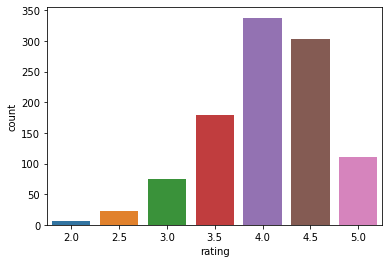

In [13]:
sns.countplot(data=df1, x='rating') #counting the number of each rating

##### Number of different price ranges

The chart gives an idea of the distribution of cafes based on their pricing, allowing us to observe the most commonly occurring price range among the cafes in London have low prices. This makes sense because coffees in London are kept at a low price and have various subscriptions since the demand is quite high. The difference between `low` priced and an `average` priced coffee shop is minimal suggesting there are many cafes that do charge higher prices. However, the high-end coffee shops are only `13` in our dataset.

In [14]:
#plotting the number of cafes for each price category
fig = px.histogram(df, x='pricerng', color_discrete_sequence=[['red', 'orange', 'yellow']], nbins=3)

fig.update_layout(
    title='Price Range of London Cafes',
    xaxis_title='Price Range',
    yaxis_title='Number of Cafes'
)

fig.show()

##### Plotting cafes on London map

First we map the cafes on a large scale to understand the market of cafes from a wider perspective. The map below shows where each cafe is located and what are the ratings for areas across. This interactive graph defines the boundaries of the location and to get a closer look, we can click one of the markers which give the specific name of the cafe. This map shows what we expect since there are more cafes in `Central London` i.e. the `City of Westminister` than any other part of London.

In [15]:
london_map = folium.Map(location=[51.5074, -0.1278], zoom_start=11) #creating a map focused on London

marker_cluster = MarkerCluster().add_to(london_map) #adding markers to the graph
for idx, row in df1.iterrows():
    rating = row['rating']
    #dividing ratings into categories and adding colours to it
    color = 'green' if rating >= 4.0 else 'orange' if rating >= 3.0 else 'red'
    #markers depicting name of cafe
    folium.Marker([row['lat'], row['long']], icon=folium.Icon(color=color), popup=row['name']).add_to(marker_cluster)

london_map

##### Density of cafes in London

To get the density of cafes around London, the heatmap is used which proves the above mentioned notion that the `Central London` is more dense with cafes than the other parts.

In [16]:
#heatmap of number of cafes around London
m = folium.Map(location=[51.5074, -0.1278], zoom_start=11)
HeatMap(data=df1[['lat', 'long']].values, radius=15).add_to(m)
m

##### Density of highly rated cafes in London

This heatmap depicts the spatial distribution of cafe ratings in London. The higher ratings are represented by a more warm tone giving us an idea of where to find the most popular cafes in London i.e. the areas including `Central London`, `West` and `North-East`.

In [17]:
london_map = folium.Map(location=[51.5074, -0.1278], zoom_start=11)

#heatmap of highly rated cafes
heat_data = df1[['lat', 'long', 'rating']].values.tolist()
HeatMap(heat_data).add_to(london_map)

london_map

##### Ratings grouped by Price

The high-end cafes are believed to be the most highly rated by a slight margin, followed by a low cost cafe and then an average priced cafe. This might suggest that whe customers purchase expensive coffee, they believe that the quality and taste of the coffee would be better as well.

In [18]:
#grouping ratings by prices
ratings_by_price = df1.groupby('pricerng')['rating'].mean().reset_index()

fig = px.bar(ratings_by_price, x='pricerng', y='rating', color='pricerng',
             title='Ratings by Price Range',
             labels={'pricerng': 'Price Range', 'rating': 'Average Rating'},
             color_discrete_sequence=['#FFC0CB', '#FF69B4', '#FF1493'])

fig.show()

##### Correlations of prices, number of reviews and ratings

1. The negative correlation between prices and rating indicates that Londoners might be conscious about pricing of the cafes negating the notion we presented before since the sample size of the high-end coffee shop is small. 
2. The positive correlation between prices and number of reviews shows that people are more likely to leave reviews for more expensive products, or that more people are purchasing those products overall.
3. The positive correlation between number of reviews and rating represent that more reviews provide a more accurate picture of a product or service's quality, or that cafes with higher ratings are more likely to attract more reviews due to psychological effects.

The strength of these correlations are not that strong and correlation does not imply causation therefore even if there might be a relationship between these variables, it does not imply that one is caused by the other.

In [19]:
#correlation between ratings, number of reviews and prices
corr_1 = df1[['rating', 'reviewcnt', 'price_num']].corr()

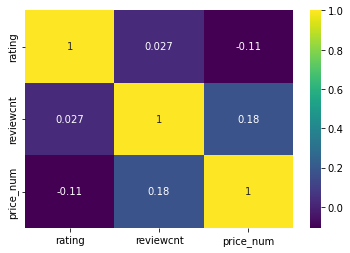

In [20]:
#heatmap for correlation between ratings, number of reviews and prices
sns.heatmap(corr_1, cmap='viridis', annot=True)
plt.show()

### 1.2 Cafe analysis using Boroughs

Now that we have looked at cafes locations in general; we should explore specific cafes location as well. Therefore, we take into account the boroughs of London which we got from [`Postcode & Geolocation API for the UK`](https://postcodes.io/). To get a more precise data on the location and the information related to cafes, we use boroughs for analysis.

##### Number of Cafes Per Borough

The barchart shows how the `City of Westminister` has the highest density of cafes in London which also has the highest population followed by `Camden`, indicating that cafes tend to cluster around highly populated areas with a lot of foot traffic. Alternatively, it could indicate that there is a higher demand for coffee in `Central London`, and therefore more cafes have opened up in those areas.

In [21]:
#Number of cafes per borough
fig = px.histogram(df, x='borough', color_discrete_sequence=['orange'], nbins=3)

fig.update_layout(
    title='Number of cafes Per Borough',
    xaxis_title='Price Range',
    yaxis_title='Number of cafes'
)

fig.show()

##### Average rating per Borough

Starting from the average ratings of boroughs, the graph depicts that `Bromley` and `Croydon` have the highest ratings. With `Newham` and `Kingston` having the lowest ratings in London. By calculating the average ratings per borough, we can get an idea of which boroughs are more popular with customers and have higher-rated cafes. This information can help cafes owners and managers understand customer preferences and adjust their offerings accordingly. By analyzing the average ratings per borough, we can get insights into the characteristics of each borough, such as demographics, culture, and lifestyle.

In [22]:
#Average rating of boroughs
fig = go.Figure()
avg_ratings = df1[['borough', 'rating']].pivot_table(index='borough', values='rating', aggfunc='mean')
fig.add_trace(go.Bar(x=sorted(list(set(df1['borough']))), y=avg_ratings['rating'], name='bar'))
fig.update_layout(title='Average Ratings per Borough', xaxis_title='Boroughs', yaxis_title='Ratings')
fig.show()

##### Average prices per Borough

This section identifies how cafe owners and managers are pricing their products in different boroughs. This information can help us understand pricing strategies and pricing elasticity to meet consumer demand. There is not much variation between the average price ranges of boroughs except for `Kingston`and `Redbridge` which have higher prices ranges whereas `Brent Teaching` and `West Sussex` have lower price range of cafes.

In [23]:
#grouping prices by boroughs
borough_price = df1.groupby(['borough'])['price_num'].mean().reset_index()

fig = go.Figure(data=go.Heatmap(
        x=borough_price['borough'],
        y=['price_num'],
        z=[borough_price['price_num']],
        colorscale='Viridis'))

#plotting borough_price
fig.update_layout(title='Average cafe Price by Borough',
                  xaxis_title='Borough',
                  yaxis_title='Price')

fig.show()

##### Cafes ratings per Borough

The box plots display the distribution of ratings for cafes in each borough including the variance in ratings, the central tendency, and the presence of outliers.

If the box plot for a particular borough shows a narrow spread of ratings and few outliers, this may indicate that customers in that borough have similar preferences for cafe offerings, and cafe owners and managers in that borough may want to focus on providing a consistent experience for customers. These include `Croydon`, `Bromley`, `Brent Teaching`, `West Sussex` and `Kingston`. 

On the other hand, boroughs like `Camden`, `Westminister`, `City and Hackney Teaching`, `Greenwich Teaching`, and `Newham` shows a wide spread of ratings and many outliers, this may indicate that customers in that borough have diverse preferences, and cafe owners and managers in that borough may want to offer a wider range of products to meet those diverse preferences.

In [24]:
#Box plot for cafes ratings for each borough
t = []
for borough in df1['borough'].unique():
    df_borough = df1[df1['borough'] == borough]
    t1 = go.Box(y=df_borough['rating'], name=borough)
    t.append(t1)

layout = go.Layout(title='Ratings by Borough',
                   xaxis=dict(title='Borough'),
                   yaxis=dict(title='Rating'))

fig = go.Figure(data=t, layout=layout)

fig.show()

### 1.3  Distance from Central London

##### Distance from central London and number of cafes nearby

In [25]:
# Define the coordinates of central London
central_london_coords = (51.5074, -0.1278)

# Calculate the distance of each cafe from central London
distances = haversine_distances(df1[['lat', 'long']], [central_london_coords])
df1['distance_from_center'] = distances

In [26]:
#getting number of cafes within 500 meters of each cafe
def distance(lat1, lon1, lat2, lon2):
    earth_radius = 6371  
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
    dist = haversine_distances([[lat1, lon1], [lat2, lon2]])[0][1] * earth_radius
    return dist

threshold_distance = 0.5
df_with_nearby = df1.copy()

for i, row in df_with_nearby.iterrows():
    lat1, lon1 = row["lat"], row["long"]
    num_nearby = 0
    for j, other_row in df_with_nearby.iterrows():
        if i != j:
            lat2, lon2 = other_row["lat"], other_row["long"]
            if distance(lat1, lon1, lat2, lon2) <= threshold_distance:
                num_nearby += 1
    df_with_nearby.at[i, "num_nearby_cafes"] = num_nearby

df_with_nearby["num_nearby_cafes"] = df_with_nearby["num_nearby_cafes"].astype(int)

There is a strong negative correlation between the distance of the cafes from the `Central London` (postcode `WC2N`) and the number of the nearby cafes. As the distance increase the number of nearby cafes decrease. Therefore, the competition between cafes decrease as there are few cafes as less alternatives are available for the customers to switch to. This also helps us understand that since there are less options for coffees as we move further away from the center; the ratings might be biased.

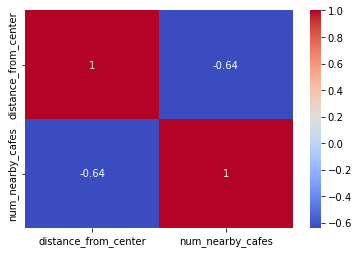

In [27]:
#correlation between distance from central London and number of nearby cafes for each cafe
corr = df_with_nearby[['distance_from_center', 'num_nearby_cafes']].corr()
#heatmap for this correlation
sns.heatmap(corr, cmap='coolwarm', annot=True)
plt.show()

##### Average ratings by distance using k-means clustering

The average ratings by distance from central London using k-means clustering represents a way to group cafes based on their proximity to central London and their average ratings. 

1. By using `k-means` clustering to group cafes based on their distance from `Central London` and average ratings, we can identify patterns and trends in the data that might not be immediately apparent through simple visual inspection.
2. We use the elbow method to help us choose the ideal number of clusters which is `3` in this case.

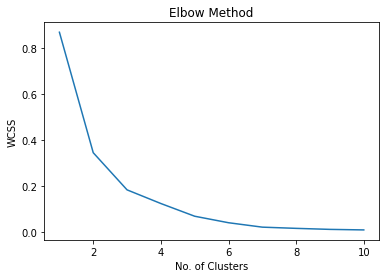

In [29]:
X = np.array(df1['distance_from_center']).reshape(-1, 1)

# Elbow method to determine the optimal number of clusters
w = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(X)
    w.append(kmeans.inertia_)

# Plot the elbow curve
import matplotlib.pyplot as plt
plt.plot(range(1, 11), w)
plt.title('Elbow Method')
plt.xlabel('No. of Clusters')
plt.ylabel('WCSS')
plt.show()

# 3 clusters seems to be the ideal choice here
kmeans = KMeans(n_clusters=3, init='k-means++', random_state=42)
kmeans.fit(X)

# Add the cluster column
df1['cluster'] = kmeans.labels_

The graph shows that as the distance from the center increases, the spread of the ratings increases as well. The first cluster in `blue` are concentrated between `3.5` and `4.5`. The second cluster in `red` shows that there is a high variance in ratings stretching from `3` to `5` and this variance increases for the third cluster `yellow` as well.

In [30]:
# finding average ratings for each cluster 
avg_ratings1 = df1.groupby(['cluster', 'distance_from_center']).mean().reset_index()

# plotting all cafes with ratings on x axis and distance from center on y axis 
# colour depicting cluster
fig = px.scatter(avg_ratings1, x='distance_from_center', y='rating', color='cluster', title='Average Ratings by Distance for Each Cluster')
fig.show()

## 2. Textual Analysis of Reviews

### 2.1 Prepare the data for analysis

In this section I will prepare and explore the data to motivate analysis of the presentation of London coffee shops in reviews.

In [31]:
# Load cafe data from file
cafedic = pd.read_pickle(r'cafedict')
cafedat = pd.DataFrame(cafedic.values())
cafedat['cafe_id'] = cafedic.keys()

# Load review data from file
revlst = []
with open('reviews.csv') as f:
    reader = csv.reader(f)
    for row in reader:
        row[0], row[1], row[2] = int(row[0]), datetime.strptime(row[1], "%Y-%m-%d"), float(row[2])
        # Add cafe-level rating to reviews data for convenience
        row.append(cafedic[row[0]]['rating'])
        revlst.append(row)
        
revdat = pd.DataFrame(revlst, columns = ['cafe_id', 'rev_date', 'rev_rating', 'rev_txt', 'cafe_rating'])

#### 2.1.1 Find 'established' cafes

Firstly, to ensure that the scores associated with the cafes are a reliable indicator of the quality of the cafe, we need to filter the data to cafes that have a sufficiently high number of reviews.

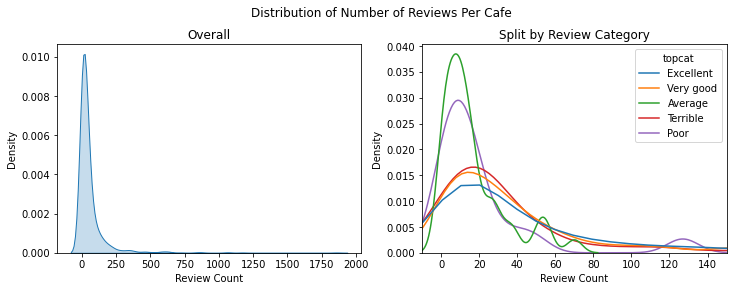

In [32]:
# Distribution of reviews
fig, ax = plt.subplots(1,2,figsize=(12, 4))
ax[1].set_xlim(left=-10, right=150)
fig.suptitle('Distribution of Number of Reviews Per Cafe')
ax[0].set_title('Overall')
ax[0].set_xlabel('Review Count')
ax[1].set_title('Split by Review Category')
ax[1].set_xlabel('Review Count')
fig.subplots_adjust(top=0.85)
# kde plots
sns.kdeplot(legend=None,data = cafedat, x = 'reviewcnt',fill = True, ax = ax[0])
sns.kdeplot(data = cafedat, common_norm=False, x = 'reviewcnt', hue = 'topcat', ax = ax[1], bw_adjust=.5);

Looking at the distribution of the number of reviews per cafe, we can see that the data is heavily right skewed (meaning there are a few cafes with an extremely high number of reviews). Interestingly there seem to be a greater number of "Excellent", "Very Good" and "Terrible" reviews than 'mediocre' reviews - this could suggest that customers are more likely to review cafes that they had strong feelings about (be those positive or negative!).

In [33]:
# Find the number of cafes above specified threshold
Q1, revmed =  cafedat['reviewcnt'].quantile(0.25), np.median(cafedat['reviewcnt'])
revthreshold = 30
lowreviewedcnt = len(cafedat[cafedat['reviewcnt'] < revthreshold])
lowreviewedp = int((lowreviewedcnt/len(cafedat)) * 100)
cafedatrev = cafedat[cafedat['reviewcnt'] >= revthreshold]
revcnt = len(cafedatrev)

print(f'\nThe median number of reviews is {revmed}, and 25% of cafes have {Q1} reviews or fewer.')
print(f'\nIf we assume that {revthreshold} reviews may be enough to faithfully represent a cafe: {lowreviewedcnt} cafes have {revthreshold} reviews or fewer on TripAdvisor, this makes up {lowreviewedp}% of our data. \n\nExcluding these cafes leaves {revcnt} for analysis.')


The median number of reviews is 21.0, and 25% of cafes have 8.0 reviews or fewer.

If we assume that 30 reviews may be enough to faithfully represent a cafe: 894 cafes have 30 reviews or fewer on TripAdvisor, this makes up 59% of our data. 

Excluding these cafes leaves 608 for analysis.


#### 2.1.2 Filter the reviews data

For each of these 608 cafes, we have collected the latest available review data from their dedicated TripAdvisor pages. Please see the scraping notebook for details on how the data was collected and preprocessed.

In [34]:
# Filter the reviews to the chosen cafes
revdatf = revdat.loc[revdat['cafe_id'].isin(cafedatrev['cafe_id'])]
avg_revs = round(np.mean(revdatf.groupby(['cafe_id'])['rev_date'].count()))
print(f"\nOn average, we collected {avg_revs} reviews per cafe.")


On average, we collected 15 reviews per cafe.


For the purposes of this analysis, we will aggregate all of the sampled reviews from each cafe, regardless of the score awarded by the customer. This is because our analysis is conducted at the level of a cafe, and, whether the review is good or bad, we are keen to uncover trends in what customers mention about the cafe.

In [35]:
# Aggregate review text
revagg = revdatf.groupby(['cafe_id','cafe_rating'])['rev_txt'].apply(lambda x: ' '.join(x)).reset_index()

#### 2.1.3 Prepare the reviews data for text analysis

In order to analyse the word choices of the customers, some steps are needed to clean the data. I will convert all to lower case, remove punctuation and irrelevant words and then lemmatise the text. I will also pull out the nouns, adjectives and noun phrases used in the text.

In [36]:
# Clean the data
noundic = {}
adjdic = {}
nounphraselst = []
revaggclean = revagg.copy()
text = list(revaggclean['rev_txt'])

for txt in range(len(text)):
    
    rawtext = text[txt]
    
    # Convert to lower case
    t = rawtext.lower()
    # Remove linebreaks & punc
    t = re.sub(r'\n', '', t)
    t = t.replace("’","")
    # Remove puncuation
    droppunc = str.maketrans('', '', string.punctuation)
    tpunc = t.translate(droppunc)
    # Remove stop words
    t = tpunc.split()
    stopwords = nltk.corpus.stopwords.words("english") + ['more']
    textf = [word for word in t if not word in stopwords]
    # Remove numbers
    textf = [re.sub(r'\w*\d\w*', '', w) for w in textf]
    # Lemmatise
    lem = WordNetLemmatizer()
    texts = [lem.lemmatize(y) for y in textf]
    # Cleaned text
    cleantext = ' '.join(texts)
    
    # Noun phrases
    nounphrases = TextBlob(tpunc).noun_phrases
    nounphraselst.extend(nounphrases)
    
    # Populate dicts for counts
    nouns = [word for (word, pos) in nltk.pos_tag(nltk.word_tokenize(cleantext)) if pos[0] == 'N']
    nouncnt = Counter(nouns)
    noundic[revaggclean['cafe_id'][txt]] = nouncnt
    adjs = [word for (word, pos) in nltk.pos_tag(nltk.word_tokenize(cleantext)) if pos[0] == 'J']
    adjcnt = Counter(adjs)
    adjdic[revaggclean['cafe_id'][txt]] = adjcnt
    
    revaggclean['rev_txt'][txt] = cleantext

In [37]:
# Prepare noun data
noundat = pd.DataFrame.from_dict(noundic, orient = 'index')
noundat['cafe_rating'] = list(revaggclean['cafe_rating'])
noundat = noundat.fillna(0)

# Prepare adjective data
adjdat = pd.DataFrame.from_dict(adjdic, orient = 'index')
adjdat['cafe_rating'] = list(revaggclean['cafe_rating'])
adjdat = adjdat.fillna(0)

### 2.2 How do reviews of coffee shops differ?
#### 2.2.1 Defining a "Good" coffee shop

In order to identify and analyse reviews for "Good" coffee shops, some exploration of the distribution of ratings is needed.

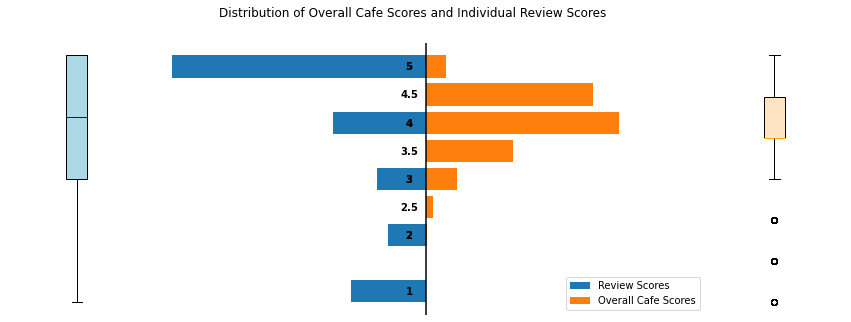

In [38]:
# Data Prep for Plotting
cafscore, revscore = revdatf.groupby(['cafe_rating']).count().reset_index(), revdatf.groupby(['rev_rating']).count().reset_index()
yabs_max = np.max([np.max(cafscore.cafe_id),np.max(np.max(revscore.cafe_id))])*1.1
axlabel, bpcol, bprat = [1,2,3,4,5,2,2.5,3,3.5,4,4.5,5], [('blue','lightblue'),(),('orange','bisque')], [revdatf.rev_rating,'',revdatf.cafe_rating]

# Set up plot
plt.rcParams["figure.figsize"]= (15,5)
fig, axis = plt.subplots(1,3, gridspec_kw={'width_ratios': [1, 4, 1]})
plt.subplots_adjust(wspace=0, hspace=0)
gs = gridspec.GridSpec(1,3)
gs.update(wspace=0, hspace=0)
plt.suptitle('Distribution of Overall Cafe Scores and Individual Review Scores')

# Boxplots
for a in [0,2]:
    bp = axis[a].boxplot(bprat[a], vert = True, patch_artist = True)
    for median, boxes in zip(bp['medians'],bp['boxes']):
        median.set_color(bpcol[a][0])
        boxes.set_facecolor(bpcol[a][1])
    axis[a].set_axis_off()

# Distribution of Scores
axis[1].barh(y = revscore.rev_rating, width = -revscore.cafe_id, height = 0.4, label = 'Review Scores')
axis[1].barh(y = cafscore.cafe_rating, width = cafscore.cafe_id, height = 0.4, label = 'Overall Cafe Scores')
axis[1].set_xlim(xmin = -yabs_max, xmax = yabs_max)
axis[1].axvline(x=0, color='black')
axis[1].legend(loc = "lower right")
axis[1].set_axis_off()

rects = axis[1].patches
for rect, axlabel in zip(rects,axlabel):
    axis[1].text(-300, rect.get_y()+rect.get_height()/4, axlabel, ha="center", va="bottom", weight = 'bold');

Using our filtered data, from the above, we can see that all coffee shop scores are in the range (2,5), with around a quarter of the scores being 4.5 or higher. This could be for a number of reasons: perhaps there is a reporting bias in that customers are more likely to leave reviews about good experiences of coffee shops than bad ones, (or perhaps coffee shops in London are simply very good!) 

Moreover, we can see that there is a greater range in the review scores than the overall cafe scores - this is unsurprising as cafe scores are an aggregation of review scores. Our data contains a sample of the most recent reviews for each cafe, it is interesting to observe that more extreme categories seem to have a relatively high number of reviews - perhaps this supports the view that customers are more likely to review very good or very bad experiences.

Aside from the true reason for this distribution of reviews, for the purposes of this assignment, we want to identify the best coffee shops in London - which is inherently a relative measure. Therefore we may normalise the reported review scores to find a relative measure of the cafes, and reassign review categorisations accordingly.

In [39]:
# Normalise scores
scores = [s/10 for s in list(range(20,55,5))]
normscores = [((ns - 2))*5/3 for ns in scores]

# Recategorise
newcats, intcats, reviewcats, reviewscore = {}, {}, ["Terrible", "Poor", "Average", "Very good", "Excellent"], [1,2,3,4,5]
for n in normscores:
    for i in reviewscore:
        if n <= i:
            newcats[scores[normscores.index(n)]], intcats[scores[normscores.index(n)]] = reviewcats[i-1], reviewscore[i-1]
            break
        else:
            pass

# Update data
noundat['newcat'], adjdat['newcat'] = [newcats[i] for i in noundat['cafe_rating']], [newcats[i] for i in adjdat['cafe_rating']]
newcats

{2.0: 'Terrible',
 2.5: 'Terrible',
 3.0: 'Poor',
 3.5: 'Average',
 4.0: 'Very good',
 4.5: 'Excellent',
 5.0: 'Excellent'}

On this new scale we can see that the bar is set high for an "Excellent" coffee shop in London: we will assume that the "best" coffee shops in London have a score of 4.5 or higher. Conversely, we will consider the worst coffee shops to have a rating of 2.5 or lower. 

Customer reviews include a score out of 5 (no half points) and a textual description of their experience, which will be the focus of this analysis.

#### 2.2.2 What do people mention about good and bad coffee shops?

To motivate our exploration of how people talk about coffee shops, let's look at the nouns and adjectives used in reviews - this will tell us what features of a coffee shop people call out, and how they describe them.

In [42]:
# Pivot word data
nounfreq, adjfreq = pd.DataFrame(noundic).T.sum(), pd.DataFrame(adjdic).T.sum()
nounphrases = [n for n in nounphraselst if len(n.split())>1 and n.find(' i')==-1 and n.find('i ')==-1]
nounphrases = Counter(nounphrases)

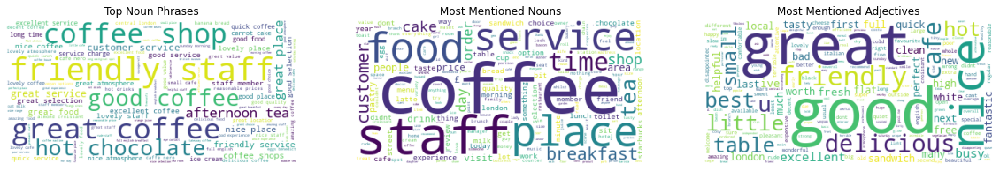

In [43]:
# Create wordclouds
fig, ax = plt.subplots(1,3, figsize=(20,10))
dat, titles = [nounphrases, nounfreq, adjfreq], ['Top Noun Phrases','Most Mentioned Nouns', 'Most Mentioned Adjectives']

for w in [0,1,2]:
    cloud = WordCloud(background_color = 'white').generate_from_frequencies(dat[w])
    ax[w].imshow(cloud)
    ax[w].set_axis_off()
    ax[w].set_title(titles[w]);

From the above, it is unsurprising to see that coffee and food were often mentioned in reviews (given that this is the key offering of coffee shops). In addition to this, themes of customer service ('staff', 'service') and the environment ('place', 'area') are also called out. The adjectives that predominantly appear seem to be positive ('good', 'great', 'nice') however, interestingly diminuative words ('small', 'little') were also often used - further investigation of the context of these words using sentiment analysis could provide an insight into whether they are used predominantly as terms of endearment or criticism.

To investigate whether the language customers use varies between good and bad reviews, I have created a quadrant.

In [44]:
# Add new (normalised) categories to the data
newnoun, newadj = noundat.copy(), adjdat.copy()
datlst = [newnoun, newadj]
for i in range(len(datlst)):
    d = datlst[i]
    d = d[d.columns.difference(['cafe_rating', 'borough', 'pricerng'])].groupby(['newcat']).mean()
    d.loc['Total',:] = d.sum(axis=0)
    d = d.T.sort_values(d.index[-1], ascending = False).reset_index()
    datlst[i] = d
newnoun,newadj = datlst[0], datlst[1]
combined = pd.DataFrame(pd.concat([newadj["Terrible"],newnoun["Terrible"]], axis=0))
combined["Excellent"] = pd.DataFrame(pd.concat([newadj["Excellent"],newnoun["Excellent"]], axis=0))
words = pd.concat([newadj["index"], newnoun["index"]], axis=0)
combined['words'] = words

In [45]:
# Create chart labels
avgwords =(combined['Terrible']+combined['Excellent'])/2 * 8 # scaled for sizing
ter10, exc10 = combined.sort_values('Terrible', ascending = False)[0:10], combined.sort_values('Excellent', ascending = False)[0:10]
ter_max, exc_max = np.max([np.max(ter10.Excellent),np.max(np.max(ter10.Terrible))])*1.1, np.max([np.max(exc10.Excellent),np.max(np.max(exc10.Terrible))])*1.1

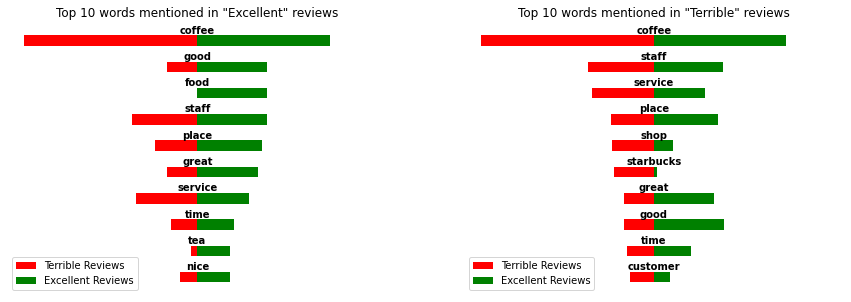

In [46]:
# Scatterplot
fig = go.Figure(data = go.Scatter(x = combined['Excellent'], y = combined['Terrible'],mode ='markers',text = combined['words'], marker=dict(color = avgwords, size = avgwords,colorscale = 'Viridis'))
                ,layout_yaxis_range=[0,6]
                ,layout_xaxis_range=[0,6])

fig.update_layout(title_text="Plot of Avg. Mentions of Words in Reviews per Cafe (Hover for words)",autosize=False,width=800,height=500, xaxis_title="Avg. Mentions for 'Excellent' Reviews", yaxis_title="Avg. Mentions for 'Terrible' Reviews")
fig.add_hline(y=3, line_color="grey")
fig.add_vline(x=3, line_color="grey")
fig.add_vrect(x0=3, x1=6, line_width=0, fillcolor="green", opacity=0.2)
fig.add_hrect(y0=3, y1=6, line_width=0, fillcolor="red", opacity=0.2)
fig.show()
fig, axis = plt.subplots(1,2, figsize=(15, 5))

# Distribution of Scores
lst10, names = [exc10, ter10], ['Excellent', 'Terrible']
for a in [0,1]:
    axis[a].barh(y = lst10[a].words, width = -lst10[a].Terrible, height = 0.4, color = 'red', label = 'Terrible Reviews')
    axis[a].barh(y = lst10[a].words, width = lst10[a].Excellent, height = 0.4, color = 'green', label = 'Excellent Reviews')
    axis[a].set_xlim(xmin = -ter_max, xmax = ter_max)
    axis[a].legend(loc = "lower left")
    axis[a].invert_yaxis()
    axis[a].set_title(f'Top 10 words mentioned in "{names[a]}" reviews')
    axis[a].set_axis_off()

    rects = axis[a].patches
    for rect, axlabel in zip(rects, lst10[a].words):
        axis[a].text(0, rect.get_y(), axlabel, ha="center", va="bottom", weight = 'bold');

The scatterplot above shows the relationship between how often words are mentioned in 'Terrible' and 'Excellent' reviews. The red section is words predominantly used in bad reviews, and the green shows words predominantly used in positive ones. The intersection of these two shows where words were often used in both positive and negative reviews. By hovering over the marks on the chart we can see that, interestingly, food is mentioned relatively often and exclusively in positive reviews. This perhaps suggests that it is a distinguishing feature of a cafe, but not something that people criticise a cafe about.

Moreover, looking at the tornado charts, we can see interestingly that "starbucks" is relatively often mentioned in bad reviews. This suggests a quirk in the underlying data in which Starbucks may make up a significant proportion of "Terrible" reviews, and in those reviews people reference the name of the establishment explicitly. To account for this next time, we could rebalance the datasets by sampling from a larger number of cafes with "Terrible" categorisation.

#### 2.2.3 How does location and price range of the cafe impact reviews?

We may expect that customers who attend coffee shops at different price points and in different parts of London may have different expectations about their experience at the coffee shop and therefore comment on them differently.

To investigate the impact of price point I will plot the average number of mentions of the most frequently mentioned words across all price points on a radar chart.

In [47]:
# Prepare data for plotting
noundat['pricerng'], adjdat['pricerng'] = [cafedic[i]['pricerng'] for i in list(noundat.index)], [cafedic[i]['pricerng'] for i in list(noundat.index)]
nounprice, adjprice = noundat[noundat.columns.difference(['cafe_rating', 'borough'])].groupby(['pricerng']).mean().T, adjdat[adjdat.columns.difference(['cafe_rating', 'borough'])].groupby(['pricerng']).mean().T
combprice = pd.DataFrame(pd.concat([nounprice,adjprice], axis=0)).reset_index()
topidx = set()
topidx.update(list(combprice.sort_values('£', ascending = False)[:10].index))
topidx.update(list(combprice.sort_values('££ - £££', ascending = False)[:10].index))
topidx.update(list(combprice.sort_values('££££', ascending = False)[:10].index))
combprice = combprice.iloc[list(topidx)]
topprice = list(combprice['index'])
combprice.iloc[:,-3:] = combprice.iloc[:,-3:].div(combprice.iloc[:,-3:].sum(axis=1), axis=0)

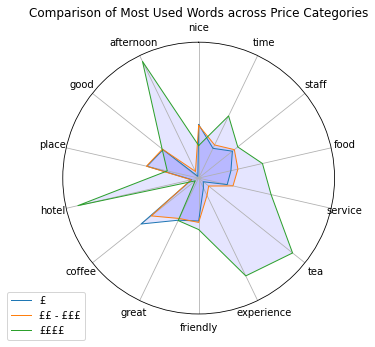

In [48]:
# Plot radar chart
N = len(topprice)
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]
ax = plt.subplot(111, polar=True)
ax.set_theta_offset(pi / 2)
ax.set_theta_direction(-1)
plt.xticks(angles[:-1], topprice)
ax.set_rlabel_position(0)
plt.yticks([10,20,30], ["10","20","30"], color="grey", size=7)

for p in ['£', '££ - £££', '££££']:
    values= combprice.loc[:, p].values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, linewidth=1, linestyle='solid', label=f"{p}")
    ax.fill(angles, values, 'b', alpha=0.1)

plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
plt.title('Comparison of Most Used Words across Price Categories')
plt.show()

Interestingly from the above, we can see that the low and mid price points are quite aligned in terms of the average usage of each of the top words, however the highest price point uses certain words relatively more. For example, service is mentioned more, which may be unsurprising as in high-end cafes the server arguably plays a more significant role in the experience. Moreover, the words 'afternoon','tea','experience' and 'hotel' are mentioned more - which may suggest that most of the high-priced cafes in the data are afternoon tea experiences at hotels.

To investigate the impact of location on how people write reviews, I will find the cosine similarity in usage of words between boroughs and use seriation to find any clusters in the boroughs.

In [49]:
# Define a cosine similarity function
def cosine_similarity(a,b):
    "compute cosine similarity of v1 to v2: (a dot b)/{||a||*||b||)"
    sumxx, sumxy, sumyy = 0, 0, 0
    for i in range(len(a)):
        x = a[i]; y = b[i]
        sumxx += x*x
        sumyy += y*y
        sumxy += x*y
    return sumxy/math.sqrt(sumxx*sumyy)
# Save the similarity index between the boroughs
def pair(s):
    for i, v1 in enumerate(s):
        for j in range(i+1, len(s)):
            yield [v1, s[j]]

In [50]:
# Prepare data for analysis
noundat['borough'],adjdat['borough'] = [cafedic[i]['borough'] for i in list(noundat.index)], [cafedic[i]['borough'] for i in list(noundat.index)]
nounb, adjb = noundat[noundat.columns.difference(['cafe_rating', 'pricerng'])].groupby(['borough']).mean().T, adjdat[adjdat.columns.difference(['cafe_rating', 'pricerng'])].groupby(['borough']).mean().T
combb = pd.DataFrame(pd.concat([nounb,adjb], axis=0)).reset_index()
boroughs = list(set([i for i in adjdat['borough'] if not isinstance(i, float)]))

In [51]:
# Calculate cosine similarity
dic={} 
for (a,b) in list(pair(boroughs)):
  dic[(a,b)] = cosine_similarity(combb[a].tolist(), combb[b].tolist())
final_df = pd.DataFrame(np.asarray([[(dic[(x,y)] if (x,y) in dic else 0) for y in boroughs] for x in boroughs]))
final_df = final_df + final_df.T
final_df.columns =  boroughs
final_df.index = boroughs

In [52]:
# Apply seriation
# Create Laplacian matrix
d = final_df.sum(axis = 1)
D = np.diag(d)
L = D - final_df
# Calculate Fiedler vector
w, v = np.linalg.eigh(L) 
eigen_idx = w.argsort()
w = w[eigen_idx] # smallest to largest
v = v[:,eigen_idx]
fiedler_vector = v[:,1] # select the second one
# Sort cosine similarity matrix
seriation_idx = fiedler_vector.argsort()
reordered_cos_sim = final_df.iloc[seriation_idx].iloc[:,seriation_idx]

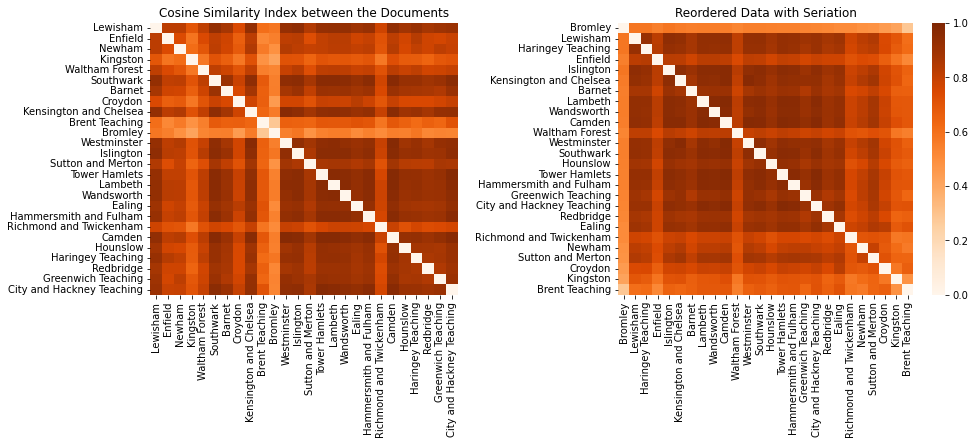

In [53]:
# Set up plot
plt.rcParams["figure.figsize"]= (15,5)
fig, ax = plt.subplots(1,3, gridspec_kw={'width_ratios': [5,1,6]})
sns.heatmap(final_df, cbar=False,ax=ax[0],vmin=0, vmax=1, cmap=sns.color_palette("Oranges", as_cmap=True))
ax[0].set_title('Cosine Similarity Index between the Documents')
ax[1].set(visible=False)
ax[2] = sns.heatmap(reordered_cos_sim, vmin = 0, vmax = 1, cmap = sns.color_palette("Oranges", as_cmap=True))
ax[2].set_title('Reordered Data with Seriation');

From the above we can see that some groups have emerged in the boroughs, however Bromley appears to share little similarity with the other boroughs. For deeper exploration, I have pulled out Bromley and Islington and Kensington (who appear to be similar) to see how the language mentioned differs.

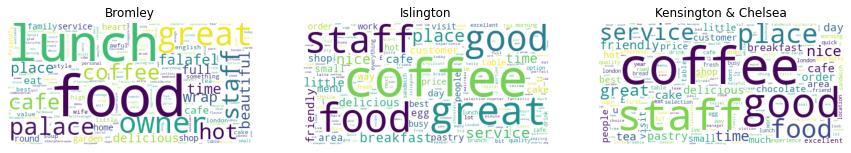

In [54]:
# Create wordclouds
brcombb, iscombb, kencombb = combb.set_index('index')['Bromley'], combb.set_index('index')['Islington'], combb.set_index('index')['Kensington and Chelsea']
boro = [brcombb, iscombb, kencombb]
title = ['Bromley', 'Islington', 'Kensington & Chelsea']
plt.rcParams["figure.figsize"] = (15,15)
fig1, ax = plt.subplots(1,3)

for i in range(len(boro)):
    cloud = WordCloud(background_color = 'white').generate_from_frequencies(boro[i])
    ax[i].imshow(cloud)
    ax[i].set_axis_off()
    ax[i].set_title(title[i])

Interestingly the reviews for Bromley appear to be relatively more focused on food than the other boroughs, and also mention the words owner and palace visibly more. This could perhaps be due to different, unique experiences being available in this area of London (perhaps there is a castle in Bromley, and therefore coffee shops that are close to it are reviewed according to their distance or convenience). This being said, further research is needed to interpret this difference. 

Equally, clearly there are close similarities between the boroughs of Islington and Kensington & Chelsea - however, these boroughs are not located geographically close but are arguably both wealthy areas of london. This may suggest that overall, based on the radar analysis and this finding, factors about the coffee shops related to price may differentiate reviews more in terms of how customers talk about their coffee shop experiences.

## 3. Prediction Models

##### Can we predict the overall rating of a cafes based on the number of excellent, very good, average, poor, and terrible reviews it has received?

We make use of the column names, `rev_Excellent`, `rev_Very good`, `rev_Average`, `rev_Poor`, and `rev_Terrible`, to predict the ratings.

In [55]:
X = df1[['rev_Excellent', 'rev_Very good', 'rev_Average', 'rev_Poor', 'rev_Terrible']]
y = df1['rating']
#splitting data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [56]:
#linear regression
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

LinearRegression()

In [57]:
#predicting y
y_pred = lr_model.predict(X_test)

The scatter plot below helps us identify how close the dots are to the diagonal line. The `R-squared` score suggests that this model explains only 23.7% of the whole model. The `MSE` and `MAE` are low, suggesting better accuracy for the model.

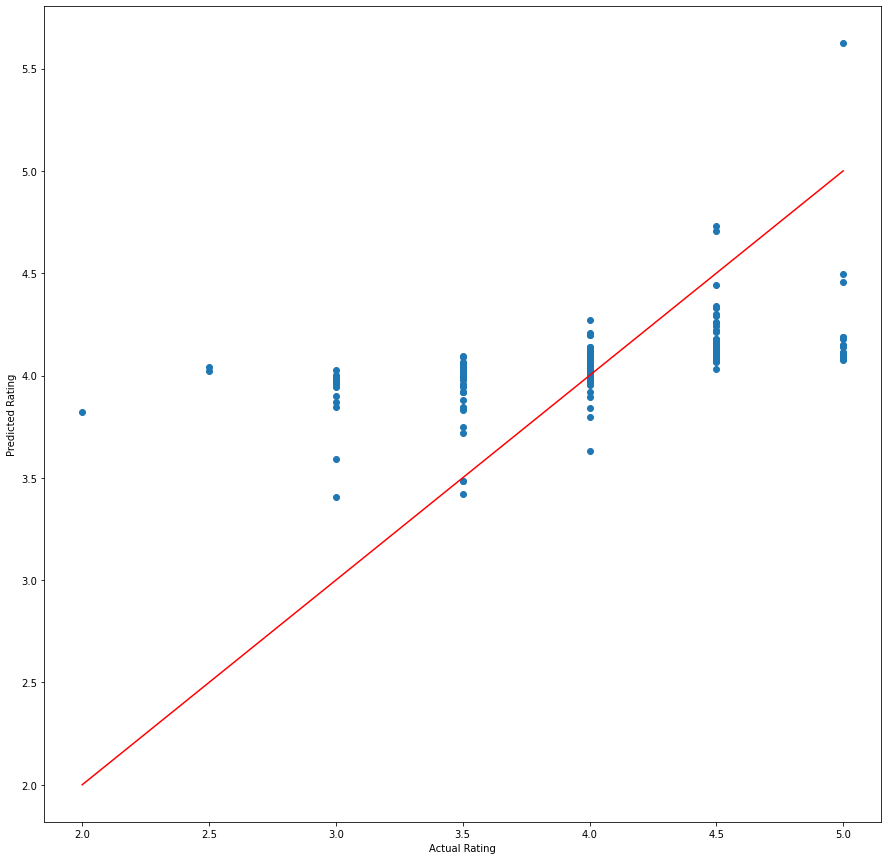

In [58]:
#scatter plot of actual and predicted value
plt.scatter(y_test, y_pred)
plt.plot([2, 5], [2, 5], color='red')
plt.xlabel('Actual Rating')
plt.ylabel('Predicted Rating')
plt.show()

In [59]:
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("The mean squared error is: ", mse)
print("The mean absolute error is: ", mae)
print("The R-squared score is: ", r2)

The mean squared error is:  0.2504861263365249
The mean absolute error is:  0.38343248946600983
The R-squared score is:  0.23743658775177567


To analyse the prediction model in more depth, the absolute values of the differences in the actual and predicted ratings (`error terms`) are plotted against the number of reviews and it can be seen that when the number of reviews are extremely large or extremely small, the error terms are large. However, the `error terms` are minimal otherwise. This suggests that when our prediction model is given an extreme value, the `error terms` tend to be larger.

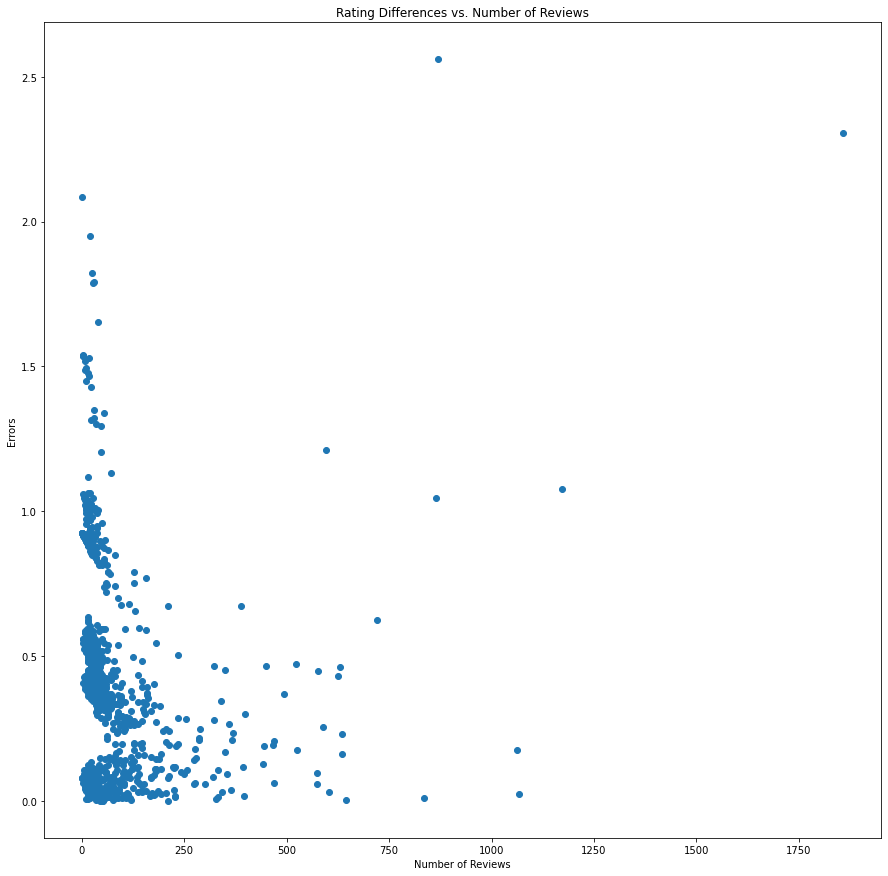

In [60]:
#difference between actual and predicted ratings
df1['rating_diff'] = abs(df1['rating'] - lr_model.predict(X))

#plotting the scatter plot of number of the reviews and errors 
plt.scatter(df1['reviewcnt'], df1['rating_diff'])
plt.xlabel('Number of Reviews')
plt.ylabel('Errors')
plt.title('Rating Differences vs. Number of Reviews')
plt.show()

#### Working with Textual Data for Predictive Purposes

As may be obvious from the analysis presented above, the dimensionality of the textual data created above is very high (around 20k features in total). When it comes to prediction, using so many features unnecessarily can create complex models which are computationally expensive to train.

In [63]:
noundat

,food,price,service,place,enjoy,weekend,breakfast,saturday,staff,value,...,hd,ho,hum,surley,flowingi,fone,promptand,cafe_rating,newcat,pricerng
1,9.0,3.0,4.0,2.0,1.0,1.0,3.0,1.0,7.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,Excellent,£
2,6.0,3.0,2.0,11.0,0.0,0.0,0.0,0.0,4.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,Excellent,££ - £££
3,7.0,1.0,4.0,3.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,Excellent,£
4,10.0,0.0,8.0,7.0,0.0,0.0,10.0,0.0,5.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,Excellent,££ - £££
5,11.0,1.0,5.0,4.0,0.0,0.0,0.0,0.0,11.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.5,Excellent,££ - £££
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
977,0.0,0.0,5.0,1.0,0.0,0.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.5,Terrible,£
1053,0.0,0.0,6.0,6.0,0.0,0.0,0.0,0.0,6.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.5,Terrible,£
1228,0.0,0.0,3.0,4.0,0.0,0.0,0.0,0.0,4.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.5,Terrible,£
1232,0.0,0.0,7.0,4.0,0.0,0.0,1.0,1.0,5.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.5,Terrible,£


In [65]:
# Calculate marginal benefit of additional features
y, x = 100*newnoun['Total'].cumsum()/newnoun['Total'].sum(), newnoun.index
ya, xa = 100*newadj['Total'].cumsum()/newadj['Total'].sum(), newadj.index
pc80no = list(y).index(list(y[y>80])[0])
pc80 = round(100*pc80no/max(x))
apc80no = list(ya).index(list(ya[ya>80])[0])
apc80 = round(100*apc80no/max(xa))

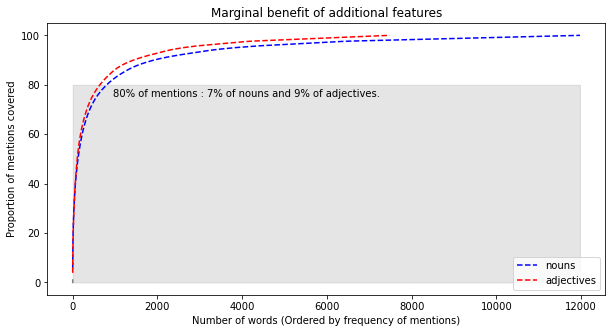

In [67]:
# Plot marginal benefit of additional features
fig, ax = plt.subplots(figsize=(10, 5))
ax.annotate(f"80% of mentions : {pc80}% of nouns and {apc80}% of adjectives.",(pc80no+150,75))
ax.fill_between(x,0,80, color = 'grey', alpha=0.2)
ax.plot(x, y, linestyle='--', color='b', label = 'nouns')
ax.plot(xa, ya, linestyle='--', color='r', label='adjectives')
ax.plot([0, 1], [0, 1], color = 'grey')
ax.legend(loc = "lower right")
plt.xlabel('Number of words (Ordered by frequency of mentions)')
plt.ylabel('Proportion of mentions covered')
ax.set_title('Marginal benefit of additional features');

From the above, we can see that 80% of the times when nouns and adjectives were mentioned in the sample of cafe reviews are captured by only ~8% of the nouns and adjectives, which suggests that the additional benefit of using more features is slim. To explore the impact of reducing the dimensionality of the data on predictions, I will use PCA (principal components analysis) and fit a multi-class logistic regression model on the data to predict the category of reviews ('Excellent', 'Terrible' etc.) based on their content.

In [68]:
# Combine noun & adjective data
nounpca, adjpca = noundat[noundat.columns.difference(['borough', 'pricerng','newcat'])], adjdat[adjdat.columns.difference(['borough', 'pricerng','newcat'])]
combdat = pd.DataFrame(pd.concat([nounpca,adjpca], axis=0)).fillna(0)

# Scale the data
scaler = StandardScaler()
scaler.fit(combdat[combdat.columns.difference(['cafe_rating'])])
scaled = scaler.transform(combdat[combdat.columns.difference(['cafe_rating'])])

# PCA
pca = PCA(n_components = 0.95).fit(scaled) # 95% of variance in data captured by principal components
pc = pca.transform(scaled)
n_pcs= pca.components_.shape[0]

# Obtain top features in each component
most_important = [np.abs(pca.components_[i]).argmax() for i in range(n_pcs)]
initial_feature_names = list(combdat.columns)
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]
dic = {i+1: most_important_names[i] for i in range(n_pcs)}
topwordspca = pd.DataFrame(dic.items())[:10]

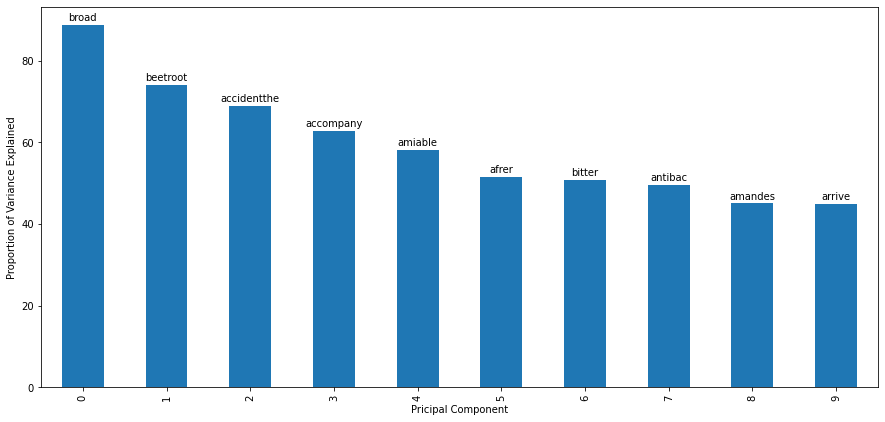

In [69]:
# Visualise first 10 PCs
var = pd.Series(pca.explained_variance_[0:10]) #percentage of variance explained
labels = ['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10']
plt.figure(figsize=(15,7))
ax = var.plot(kind="bar")
ax.set_xlabel('Pricipal Component')
ax.set_ylabel('Proportion of Variance Explained')
marks = list(topwordspca[1])
rects = ax.patches
for rect, label in zip(rects, marks):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width() / 2, height + 0.5, label, ha="center", va="bottom")

From the sample shown above, we can see that a high proportion of the variance in the data is explained by a few principal components. The columns are labeled with the features (words) which had the biggest influence in the principal component - it is interesting to see that the PC1 is most strongly correlated with the word 'service' and it explains a large proportion of the variance in the data. This could support the view that service is a central topic in the cafe reviews.

In [71]:
# PC Prediction
x, y = pc,[intcats[i] for i in combdat['cafe_rating']]
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.3)
model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
model.fit(x_train, y_train)
predictions = np.around(model.predict(x_test)) 
pcaccuracy = metric.accuracy_score(y_test,predictions)

# Prediction with full data
combdattemp = combdat[combdat.columns.difference(['borough', 'pricerng'])]
x, y = combdattemp[combdattemp.columns.difference(['cafe_rating'])], [intcats[i] for i in combdat['cafe_rating']]
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.3)
model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
model.fit(x_train, y_train)
predictions = np.around(model.predict(x_test)) 
npaccuracy = metric.accuracy_score(y_test,predictions)

print(f'PC Prediction Accuracy: {pcaccuracy}\n Prediction Accuracy: {npaccuracy}')

PC Prediction Accuracy: 0.34794520547945207
 Prediction Accuracy: 0.40821917808219177


It is unsuprising that the prediction accuracy from the model on the full data is higher, as logistic regression will weight features based on how well they influence the chosen predictor, rather than PCA which aims to capture the maximum amount of variance across all the features when combining them into new features.

This being said, the accuracy of the model trained on the full data is not substantially better than the model based on prinicpal components. Therefore given the additional benefits of fewer features in model training such as reduced computation time and memory requirements, if we were to continue developing this classification model beyond the scope of this project, we would keep PCA or other forms of dimensionality reduction as part of the process.

# Conclusion

In conclusion, the project first discusses the cafes trends in general across London which helps us get a good starting point to analyse how the market and consumer behaviour is structured across London. However, to get an in depth analysis on how these trends vary in London, we group the cafes according to their boroughs and distance from the center to evaluate how these trends are different for each borough. We see a trend of clustering of cafes around the `Central London` and as the distance from the center increases, the number of cafes nearby decreases significantly which is also depicted in the heatmaps. Furthermore, the ratings and reviews vary more when the distance from the center is increased. The ratings boxplots of each borough depicts how even though the boroughs are closely packed together since they are part of London; the statistical analysis of ratings differ for each borough. The prediction models help us determine how the variables chosen determine the prediction of ratings.

Lastly, it is worth mentioning the limitations of the project in order to address these in the future.

   1. The website used for webscraping includes only `1500` cafes out of which `1034` are analysed due to missing data for EDA purposes. The TripAdvisor displayed the top `1500` cafes in London; whereas the number of cafes would be much larger than this; however the data used in this project is a good sample size for data analysis. Furthermore, the sample size of the high-end cafes are only restricted to `13`; therefore, statistical analysis might not be accurate.
   2. For the prediction analysis, the choice of variables used to predict the ratings could be changed i.e. choosing a variable which would have a higher R-squared score.
   3. The sample of reviews used for text analysis was not evenly distributed between different categories of reviews, we had more positive than negtive reviews therefore some underlying trends may have been missed.
   
In future, it might be worthwhile to include a more inclusive dataset with more diverse ratings and to come up with more complex prediction models to determine the culture of cafes in London.

## References

1. K-means clustering: 
    - https://medium.com/nerd-for-tech/coffee-shops-analysis-in-manhattan-segmenting-and-clustering-neighborhoods-dba71fee3429 
2. Web scraping from TripAdvisor:
    - https://scrapfly.io/blog/how-to-scrape-tripadvisor/
3. Cafes analysis: 
    - https://github.com/mohammedhalosaimi/Riyadh-Coffee-Shops-Web-Scraping/blob/master/Riyadh-coffee-shopes.ipynb
    - https://dev.to/dmitryzub/ukrainian-coffee-shops-portfolio-analysis-project-532j
4. Creating heatmaps:
    - https://www.kaggle.com/code/daveianhickey/how-to-folium-for-maps-heatmaps-time-data/notebook
5. Creating Radar Charts:
    - https://www.python-graph-gallery.com
6. Text Vectorisation:
    - https://okan.cloud/posts/2021-04-08-text-vectorization-using-python-term-document-matrix/